# Preprocesamiento de Datos

# Introducción

![title](img/Imagen1.png)

Recordemos que el preprocesamiento de datos es parte de un proceso general el **KDD**. En este Notebook nos centraremos en varios aspectos vistos en la parte de teoría, cogiendo como ejemplo los datos del aceite. Estos aspectos son los que se detallan a continuación: <br>

1. **Lectura** de datos <br>
    1.1. Marcadores <br>
    1.2. Huella espectral <br>
2. **Integración** de datos <br>
3. **Visualización** de los datos <br>
    3.1. Diagrama de barras <br>
    3.2. Boxplot Agrupado <br>
4. **Transformación** de datos <br>
    4.1. PCA <br>
    4.2. LDA <br>
    4.3. Encoding <br>
    4.3. Normalización <br>
5. **Reducción** de datos <br>
    5.1. Selección de atributos <br>   
    
-------------------------------------------------
El objetivo de esta primera parte es preparar el conjunto de datos que utilizaremos para realizar posteriormente las tareas de **clasificación**

In [25]:
#Importar librerías
import numpy as np
import pandas as pd
from numpy import genfromtxt
from PIL import Image
from os import listdir
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler


np.random.seed(7)

# 1. Lectura de datos

Los datos sobre los que vamos a trabajar se componene de ejemplos de muestras de aceite perteneciente a 2 cosechas diferentes: <br>
    **Cosecha FII** : comprende los años 2014-2015 <br>
    **Cosecha FIII** : comprende los años 2015-2016 <br>
    

## 1.1. Marcadores

![title](img/Imagen2.png)

In [53]:
# Leer datos
#Lectura de las 2 hojas normalizadas
datos_f2 = pd.read_excel('data/marcadores/datos.xlsx', sheet_name='fii sin normalizar')
datos_f3 = pd.read_excel('data/marcadores/datos.xlsx', sheet_name='fiii sin normalizar')

Recordemos que en el ámbito de la Ciencia de Datos, los conjuntos de datos se representan mediante una matriz, en la que las filas osn las **instancias** y las columnas los **atributos**

![title](img/Imagen3.png)

In [3]:
#Mostrar las primeras filas de la cosecha F2
datos_f2.head()

,Name,Class,Baseline,RIP Position,RIP Height,M1,M2,M3,M4,M5,...,M104,M105,M106,M107,M108,M109,M110,M111,M112,M113
0,E_2130,E,0.119,6.687,5.146,0.730,0.606,0.391,1.137,0.558,...,0.492,0.197,0.244,0.116,0.047,0.344,0.272,0.402,0.147,0.236
1,E_2133,E,0.134,6.687,5.320,0.749,0.586,0.482,0.947,0.705,...,0.253,0.146,0.393,0.079,0.039,0.209,0.279,0.292,0.152,0.261
2,E_2175,E,0.134,6.693,5.187,0.776,0.701,0.368,1.028,0.611,...,0.359,0.180,0.144,0.075,0.047,0.250,0.200,0.405,0.279,0.148
3,E_2208,E,0.141,6.680,4.311,0.208,0.888,0.778,0.923,0.851,...,0.188,0.217,0.563,0.109,0.038,0.110,0.199,0.380,0.182,0.264
4,E_2211,E,0.152,6.700,5.234,0.057,1.176,0.476,1.052,0.575,...,0.186,0.134,0.595,0.086,0.032,0.230,0.208,0.385,0.184,0.374


In [4]:
## TODO
#Mostrar las primeras filas de la cosecha F3

In [4]:
# Contar el número de instancias para cada clase en la cosecha F2
datos_f2.Class.value_counts()

V    127
E     70
L     28
Name: Class, dtype: int64

In [5]:
## TODO
# Contar el número de instancias para cada clase en la cosecha F3

## 1.2. Huella espectral

La lectura de datos con imágenes se puede realizar de muchas formas diferentes, en este caso se utilizará la librería **Keras** que directamente divide el conjunto de datos en dos, uno para entrenar los modelos y otro para evaluar el modelo

In [26]:
## Leer UNA imagen
def get_img(data_path):
    # Getting image array from path:
    g = open(data_path,'r')
    temp = genfromtxt(g, delimiter = ';')
    im = Image.fromarray(temp)
    return im

data_path = './data/huella_espectral/E/150317_003735_C4854_1_program_pos.csv'
img = get_img(data_path)

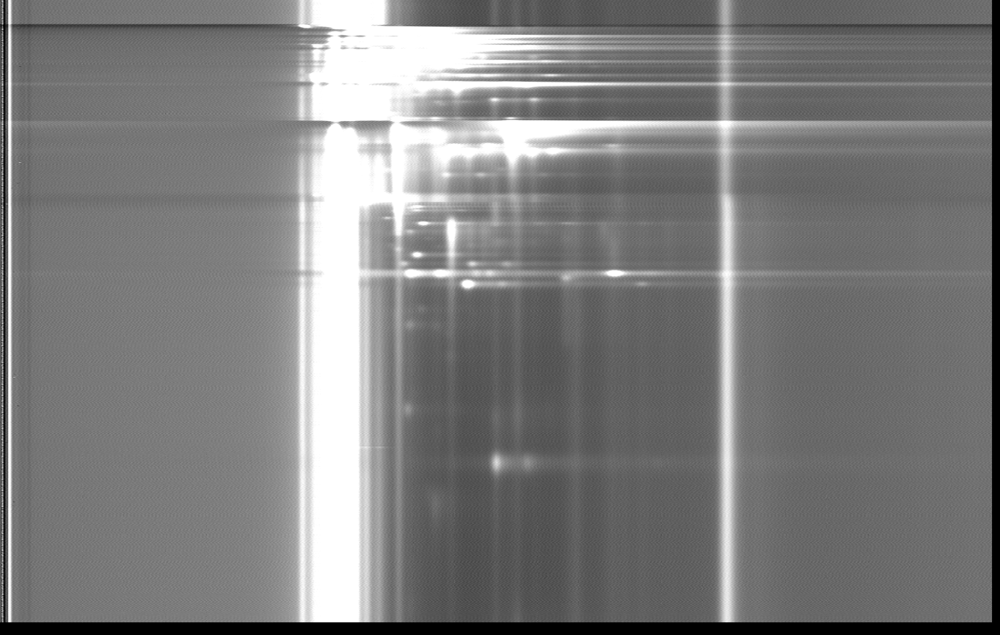

In [27]:
img.convert('P')


In [28]:
def get_dataset(dataset_path="./data/huella_espectral/"):
    # Getting all data from data path:
    try:
        X = np.load('./data/huella_espectral/X.npy')
        Y = np.load('./data/huella_espectral/Y.npy')
    except:
        labels = listdir(dataset_path) # Geting labels
        print('Categories:\n', labels)
        len_datas = 0
        for label in labels:
            len_datas += len(listdir(dataset_path+'/'+label))
        X = np.zeros((len_datas, 1905, 3000), dtype='uint8')
        Y = np.zeros(len_datas)
        count_data = 0
        count_categori = [-1,''] # For encode labels
        for label in labels:
            datas_path = dataset_path+'/'+label
            for data in listdir(datas_path):
                img = get_img(datas_path+'/'+data)
                X[count_data] = img
                # For encode labels:
                if label != count_categori[1]:
                    count_categori[0] += 1
                    count_categori[1] = label
                Y[count_data] = count_categori[0]
                count_data += 1
        # Create dateset:        
        np.save('./data/huella_espectral/X.npy', X)
        np.save('./data/huella_espectral/Y.npy', Y)
    return X, Y

X, y =get_dataset()

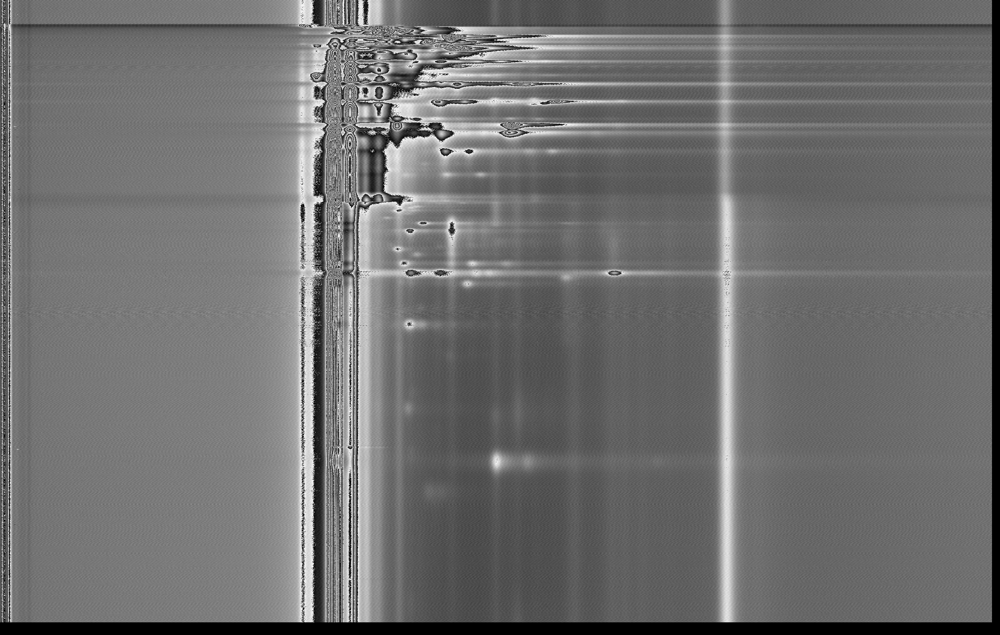

In [30]:
im = Image.fromarray(X[20])
im

La imagen de arriba está tomando por defecto la escala de grises para represntar la imagen, esta escala se puede cambiar. Si echa un vistazo al siguiente [enlace](https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html) puede ver qué paletas de colores existen

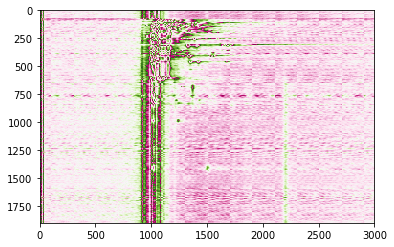

In [31]:
import matplotlib
plt.imshow(X[0], cmap='PiYG') ##TODO: Pruebe con distintas paletas de colores (atributo cmap)

# 2. Integración de datos

En esta parte lo que se hará es recoger todos los datos de los marcadores de las dos cosechas y unirlos en un solo DataFrame

In [54]:
datos_f2['Cosecha'] = "F2"
datos_f3['Cosecha'] = "F3"
datos = pd.concat([datos_f2, datos_f3], ignore_index=True)
# Ver número total de instancias
print("Contamos con "+np.str(datos.shape[0])+" instancias en total")

Contamos con 533 instancias en total


# 3. Visualización de los datos

Utilizaremos la librería **Seaborn** que nos proporciona, de forma fácil, una implementación de gráficos muy usados. En el siguiente [enlace](https://seaborn.pydata.org/) podéis encontrar toda la información sobre esta librería. Además también os dejamos una [web](https://datavizcatalogue.com/ES/index.html) en la que podéis ver un catálogo de visualización de datos según el objetivo

## 3.1. Diagrama de Barras

El gráfico de barras clásico utiliza barras horizontales o verticales (gráfico de columnas) para mostrar comparaciones numéricas discretas entre categorías. Un eje del gráfico muestra las categorías específicas que se comparan y el otro eje representa una escala de valores discretos.

El gráfico de barras clásico utiliza barras horizontales o verticales (gráfico de columnas) para mostrar comparaciones numéricas discretas entre categorías. Un eje del gráfico muestra las categorías específicas que se comparan y el otro eje representa una escala de valores discretos.

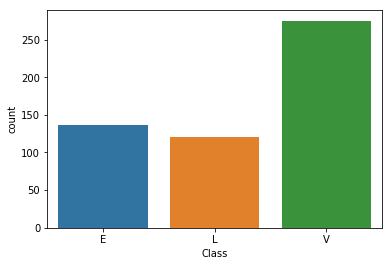

In [6]:
barras = sns.countplot(data=datos, x='Class')

In [ ]:
#TODO
#Hacer cambios necesarios para que no distinga entre Cosechas (parámetro "hue")
barras = sns.countplot(data=datos, x='Class', hue = "XXXXXX" )

## Diagrama de cajas y bigotes 

Un diagrama de cajas y bigotes es una manera conveniente de mostrar visualmente grupos de datos numéricos a través de sus cuartiles.

Las líneas que se extienden paralelas a las cajas se conocen como «bigotes», y se usan para indicar variabilidad fuera de los cuartiles superior e inferior. Los valores atípicos se representan a veces como puntos individuales que están en línea con los bigotes. Los diagramas de cajas y bigotes se pueden dibujar vertical u horizontalmente.

![title](img/Imagen4.png)

El objetivo a continuación es observar si existen diferencias significativas entre el "RIP Height" según la cosecha ante la que nos encontremos

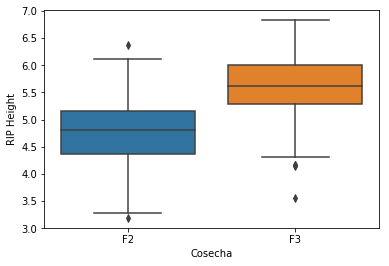

In [7]:
boxplot = sns.boxplot(x= 'Cosecha', y = 'RIP Height', data = datos)

In [ ]:
boxplot = sns.boxplot(x= 'Cosecha', y = 'RIP Height', hue = 'XXXXXXX', data = datos)

# 4. Transformación de Datos

Un problema muy común que nos encontramos día a día cuando nos llega un conjunto de datos a estudiar es que es imposible tratar los datos sin realizar una transformación previa. Por ejemplo:
- La cantidad de variables a utilizar es muy grande y no se puedden sacar conclusiones a simple vista, ya que superan las 3 dimensiones, es por ello que se utilizan técnicas de **reducción de la dimensionalidad** como **PCA** y **LDA** para conocer a priori si los datos se comportan de una determinada forma u otra
- Algunos algoritmos de clasificación trabajan con un tipo de etiqueta en concreto, normalmente de tipo numérico. Cuando el conjunto de datos a estudiar tiene una etiqueta que no es numérica (por ejemplo: alto,bajo) hay que hacer tareas de **encoding**
- Otro problema muy frecuente es que las variables no están normalizadas, esto es, tienen una escala numérica muy diferente unas de otras, lo que puede afectar mucho a los resultados. Para solucionar este problema se utilizan técnicas de **normalización**

## 4.1. Principal Component Analysis (PCA)

El análisis de componentes principales (en español ACP, en inglés, PCA) es una técnica utilizada para describir un conjunto de datos en términos de nuevas variables ("componentes") no correlacionadas, con el objetivo de reducir la dimensionalidad.

In [55]:
x = datos.drop(['Name','Baseline','RIP Position', 'RIP Height', 'Cosecha', 'Class'], axis = 1) #Eliminamos todas las columnas menos los marcadores
y = datos['Class'] # Recuperamos la clase

# =============================================================================
#  PCA
# =============================================================================
pca = PCA(n_components=2) #Indicamos el número de nuevas variables que queremos obtener (máximo 3 para que sean visuales)
principalComponents = pca.fit_transform(x)

principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2']) 

finalDf = pd.concat([principalDf, y], axis = 1) #Añadimos la clase a las dos nuevas variables
finalDf.head()

,principal component 1,principal component 2,Class
0,-1.254699,0.508505,E
1,-1.059120,-0.508064,E
2,0.934240,0.302917,E
3,-1.279665,0.550158,E
4,-1.965901,1.164338,E


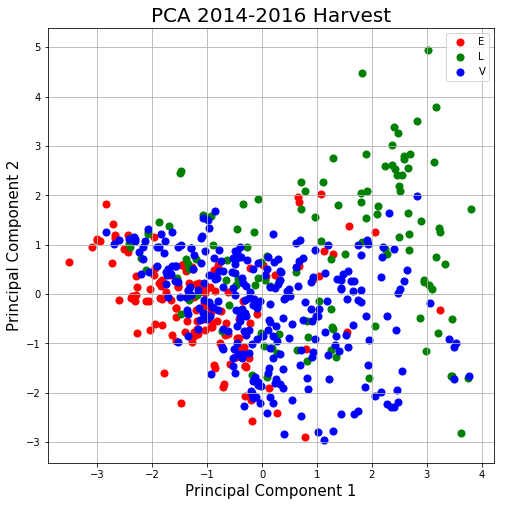

In [56]:
# =============================================================================
#  VISUALIZACIÓN
# =============================================================================
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('PCA 2014-2016 Harvest', fontsize = 20)

targets = ['E', 'L', 'V']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Class'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## 4.1. Linear Discriminant Analysis (LDA)

El objetivo de esta técnica es la misma que la del PCA, solo que la forma de construcción de las variables es distinta tal como se vio en la clase de teoría. Además esta técnica sí tiene en cuenta la etiqueta

In [27]:
lda = LinearDiscriminantAnalysis(n_components=2)
X_r2 = lda.fit(x, y).transform(x)

ldaDf = pd.DataFrame(data = X_r2
             , columns = ['attribute 1', 'atrribute 2']) 

finalDf_lda = pd.concat([ldaDf, y], axis = 1) #Añadimos la clase a las dos nuevas variables
finalDf_lda.head()

,attribute 1,atrribute 2,Class
0,-0.589909,-0.296577,E
1,-1.261288,0.836527,E
2,-0.665511,0.775654,E
3,-1.030435,-0.368022,E
4,-1.336029,0.553611,E


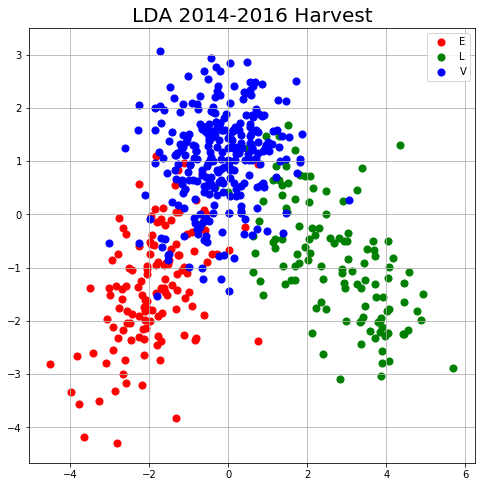

In [29]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_title('LDA 2014-2016 Harvest', fontsize = 20)

targets = ['E', 'L', 'V']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf_lda['Class'] == target
    ax.scatter(finalDf_lda.loc[indicesToKeep, 'attribute 1']
               , finalDf_lda.loc[indicesToKeep, 'atrribute 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## 4.3. Encoding

En este apartado veremos cómo codificar atributos discretos mediante valores numéricos. Esto es necesario porque muchos de los algoritmos de aprendizaje solo soportan atributos numéricos.

### Codificación Label Encoding

La codificación _label encoding_ consiste en sustituir cada valor del atributo discreto por un valor numérico tal como se ve a continuación:
![title](img/Imagen5.png)

In [31]:
le = LabelEncoder()
y_le = le.fit_transform(datos.Class)
y_le

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,

### One Hot Encoding

La codificación _one hot_ da lugar (para un atributo discreto) a tantas columnas como valores distintos tenga el atributo:
![title](img/Imagen6.png)

In [57]:
oh_encoder = OneHotEncoder()
y_oh = oh_encoder.fit_transform(datos.Class.values.reshape(-1,1)).toarray()
y_oh

array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       ...,
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 1.]])

## 4.4. Normalization & Standardization

### Normalization

Consiste en normalizar las columnas de un conjunto de datos en base a otra, por ejemplo, en el caso del aceite es muy común normalizar los marcadores en base al valor máximo del RIP. La normalización en este caso consiste en dividir cada uno de los marcadores por el valor máximo del RIP

In [58]:
RIP_Height = datos['RIP Height']
marcadores = datos.iloc[:,5:-1] #recuperamos los marcadores
normalizado = pd.DataFrame() #creamos un dataframe en el que se guardarán los datos normalizados

for row in marcadores.columns:
    normalizado[row]=marcadores.loc[:,row]/RIP_Height 
    
normalizado['Class'] = datos.Class # Añadimos la clase
    
normalizado.head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,M105,M106,M107,M108,M109,M110,M111,M112,M113,Class
0,0.141858,0.117761,0.075981,0.220948,0.108434,0.038282,0.020016,0.042752,0.104742,0.072872,...,0.038282,0.047415,0.022542,0.009133,0.066848,0.052857,0.078119,0.028566,0.045861,E
1,0.140789,0.110150,0.090602,0.178008,0.132519,0.032143,0.022744,0.027256,0.067857,0.039662,...,0.027444,0.073872,0.014850,0.007331,0.039286,0.052444,0.054887,0.028571,0.049060,E
2,0.149605,0.135146,0.070947,0.198188,0.117794,0.033353,0.019665,0.038558,0.113939,0.075766,...,0.034702,0.027762,0.014459,0.009061,0.048197,0.038558,0.078080,0.053788,0.028533,E
3,0.048249,0.205985,0.180469,0.214103,0.197402,0.038506,0.022965,0.044305,0.083739,0.049408,...,0.050336,0.130596,0.025284,0.008815,0.025516,0.046161,0.088147,0.042218,0.061239,E
4,0.010890,0.224685,0.090944,0.200994,0.109859,0.031525,0.016431,0.054834,0.064005,0.049484,...,0.025602,0.113680,0.016431,0.006114,0.043943,0.039740,0.073558,0.035155,0.071456,E


Estos datos nos servirán para tareas posteriores de clasificación, por lo que lo próximo será guardarlos en un archivo Excel

In [60]:
normalizado.to_excel('data/marcadores/normalizados.xlsx', index=False)

### Standardization

Se ha comprobado que las técnicas de Deep Learning trabajan mejor cuando los datos están estandarizados, es decir, cuando las columnas de datos numéricos tienen media igual a cero y desviación típica igual a 1. De forma matemática esto se consigue con la siguiente fórmula:

![title](img/Imagen7+.png)
Sklearn proporciona un método **StandardScaler** que realiza esta transformación.

Veamos en primer lugar si el primer marcador sigue una distribución normal pintando un histograma de la columna

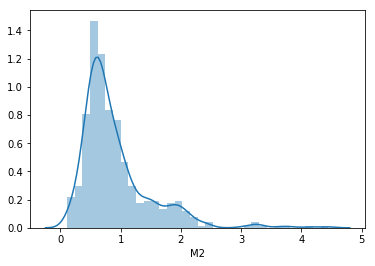

In [62]:
sns.distplot(datos.M2)

In [60]:
scaler = StandardScaler()
scaled_markers = scaler.fit_transform(marcadores)

scaled_markers = pd.DataFrame(scaled_markers, columns=marcadores.columns.values)
scaled_markers['Class'] = datos.Class
scaled_markers.head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9,M10,...,M105,M106,M107,M108,M109,M110,M111,M112,M113,Class
0,-0.273783,-0.513408,-0.826135,1.393943,-0.642081,-0.464297,-0.875568,-0.544503,0.416824,0.955343,...,-0.198018,-0.804670,-0.473662,-0.880367,1.956256,-0.084206,-0.286449,-0.777528,-0.189093,E
1,-0.244843,-0.547341,-0.492779,0.452457,-0.111067,-0.696747,-0.733574,-0.932222,-0.647951,-0.565952,...,-0.442954,-0.025585,-0.842277,-1.086104,-0.238048,-0.038634,-1.077413,-0.751159,-0.058777,E
2,-0.203718,-0.352227,-0.910390,0.853827,-0.450627,-0.678866,-0.883456,-0.647895,0.727882,1.122314,...,-0.279663,-1.327546,-0.882127,-0.880367,0.428370,-0.552945,-0.264878,-0.081383,-0.647805,E
3,-1.068874,-0.034955,0.591543,0.333532,0.416334,-0.741449,-0.907122,-0.694421,-0.647951,-0.547400,...,-0.101964,0.863305,-0.543400,-1.111821,-1.847204,-0.559456,-0.444642,-0.592944,-0.043139,E
4,-1.298871,0.453679,-0.514759,0.972752,-0.580671,-0.750390,-1.009673,-0.198141,-0.803480,-0.120695,...,-0.500586,1.030625,-0.772539,-1.266125,0.103288,-0.500863,-0.408689,-0.582397,0.530252,E


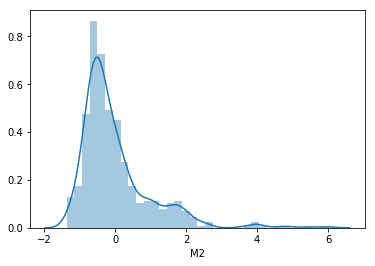

In [63]:
sns.distplot(scaled_markers.M2)